#Imports

In [ ]:
!pip install diffusers accelerate transformers bitsandbytes einops xformers==0.0.25 nvidia-cutlass huggingface_hub datasets timm==1.0.9 controlnet-aux==0.0.7 torchmetrics  torch-fidelity  --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.4/42.4 kB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 202.4/202.4 kB 9.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 222.5/222.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 80.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.5/755.5 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 106.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 86.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 53.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 39.0 MB/s eta 0:00:00


In [ ]:
import argparse
import contextlib
import gc
import logging
import math
import os
import random
import shutil
from pathlib import Path
from typing import Any, Dict, List, Optional, Tuple, Union

import accelerate
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.checkpoint
import transformers
from accelerate import Accelerator
from accelerate.logging import get_logger
from accelerate.utils import ProjectConfiguration, set_seed
from datasets import load_dataset
from huggingface_hub import create_repo, upload_folder
from packaging import version
from PIL import Image
from PIL import PngImagePlugin
from torchvision import transforms
from tqdm.auto import tqdm
from transformers import AutoTokenizer, PretrainedConfig
from einops import rearrange


import diffusers
from diffusers import (
    AutoencoderKL,
    ControlNetModel,
    DDPMScheduler,
    StableDiffusionControlNetPipeline,
    UNet2DConditionModel,
    UniPCMultistepScheduler,
)
from diffusers.optimization import get_scheduler
from diffusers.utils import check_min_version, is_wandb_available, deprecate
from diffusers.utils.hub_utils import load_or_create_model_card, populate_model_card
from diffusers.utils.import_utils import is_xformers_available
from diffusers.utils.torch_utils import is_compiled_module
from diffusers.configuration_utils import ConfigMixin, register_to_config
from diffusers.utils import load_image, make_image_grid
from diffusers.models.controlnet import ControlNetOutput, ControlNetConditioningEmbedding
from diffusers.models.embeddings import TextImageProjection, TextImageTimeEmbedding, TextTimeEmbedding, TimestepEmbedding, Timesteps
from diffusers.models.unets.unet_2d_blocks import (
    CrossAttnDownBlock2D,
    DownBlock2D,
    UNetMidBlock2D,
    UNetMidBlock2DCrossAttn,
    get_down_block,
)
from diffusers.models.resnet import Downsample2D
import cv2

from torchmetrics.image.fid import FrechetInceptionDistance
from torchmetrics.image.lpip import LearnedPerceptualImagePatchSimilarity
from torchmetrics.image import PeakSignalNoiseRatio
from torchmetrics.image import StructuralSimilarityIndexMeasure

from transformers import CLIPTextModel

import bitsandbytes as bnb
import xformers
from controlnet_aux import CannyDetector

from IPython.display import display

from huggingface_hub import login
login("")

PngImagePlugin.MAX_TEXT_CHUNK = 20485760
torch.manual_seed(42)
torch.cuda.manual_seed(42)
np.random.seed(42)

The token has not been saved to the git credentials helper. Pass `add_to_git_credential=True` in this function directly or `--add-to-git-credential` if using via `huggingface-cli` if you want to set the git credential as well.
Token is valid (permission: write).
Your token has been saved to /root/.cache/huggingface/token
Login successful


/usr/local/lib/python3.10/dist-packages/controlnet_aux/mediapipe_face/mediapipe_face_common.py:7: UserWarning: The module 'mediapipe' is not installed. The package will have limited functionality. Please install it using the command: pip install 'mediapipe'
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/controlnet_aux/segment_anything/modeling/tiny_vit_sam.py:654: UserWarning: Overwriting tiny_vit_5m_224 in registry with controlnet_aux.segment_anything.modeling.tiny_vit_sam.tiny_vit_5m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/usr/local/lib/python3.10/dist-packages/controlnet_aux/segment_anything/modeling/tiny_vit_sam.py:654: UserWarning: Overwriting tiny_vit_11m_224 in registry with controlnet_aux.segment_anything.modeling.tiny_vit_sam.tiny_vit_11m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.

#Knowledge Distilation

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

apply_canny = CannyDetector()
low_threshold = 70
high_threshold = 200

Mounted at /content/drive


In [ ]:
MODEL_PATH = "stabilityai/sd-turbo"
CONTROLNET_PATH = "thibaud/controlnet-sd21-canny-diffusers"
DATASET_PATH = "ErioLatte/laion_60k"
weight_dtype = torch.float16
REVISION = None
OUTPUT_DIR = ""
LOGGING_DIR = ""
CACHE_DIR = ""
TRAIN_DATA_DIR = ""
BATCH_SIZE = 4
GRADIENT_ACCUMULATION_STEPS = 8
EPOCH = 3
WARMUP_STEPS = 0
LR = 1e-5

VALIDATION_PATH = "/content/7.png"
VALIDATION_PROMPT = "blue person, purple and blue stars, beautiful majestic"
VALIDATION_STEP = 200

In [ ]:
logging_dir = Path(OUTPUT_DIR, LOGGING_DIR)
accelerator_project_config = ProjectConfiguration(project_dir=OUTPUT_DIR, logging_dir=logging_dir)

accelerator = Accelerator(
    gradient_accumulation_steps=GRADIENT_ACCUMULATION_STEPS,
    project_config=accelerator_project_config,
    mixed_precision="fp16"
)

In [ ]:
def collate_fn(examples):
    pixel_values = torch.stack([example["pixel_values"] for example in examples])
    pixel_values = pixel_values.to(memory_format=torch.contiguous_format).float()

    conditioning_pixel_values = torch.stack([example["conditioning_pixel_values"] for example in examples])
    conditioning_pixel_values = conditioning_pixel_values.to(memory_format=torch.contiguous_format).float()

    input_ids = torch.stack([example["input_ids"] for example in examples])

    return {
        "pixel_values": pixel_values,
        "conditioning_pixel_values": conditioning_pixel_values,
        "input_ids": input_ids,
    }

def make_train_dataset(tokenizer, accelerator, size=25000, image_col_name="image", prompt_col_name="text", guide_col_name="guide"):
    # Get the datasets: you can either provide your own training and evaluation files (see below)
    # or specify a Dataset from the hub (the dataset will be downloaded automatically from the datasets Hub).

    # In distributed training, the load_dataset function guarantees that only one local process can concurrently
    # download the dataset.
    if DATASET_PATH is not "" and DATASET_PATH is not None:
        # Downloading and loading a dataset from the hub.
        dataset = load_dataset(
            DATASET_PATH,
            cache_dir=CACHE_DIR,
        )
    else:
        if TRAIN_DATA_DIR is not "" and TRAIN_DATA_DIR is not None:
            dataset = load_dataset(
                TRAIN_DATA_DIR,
                cache_dir=CACHE_DIR,
            )
        # See more about loading custom images at
        # https://huggingface.co/docs/datasets/v2.0.0/en/dataset_script

    # Preprocessing the datasets.
    # We need to tokenize inputs and targets.
    temp = dataset["train"].select(range(size))
    dataset['train'] = temp
    column_names = dataset["train"].column_names

    # 6. Get the column names for input/target.
    image_column = image_col_name
    if image_column not in column_names:
        raise ValueError(
            f"`--image_column` value 'image' not found in dataset columns. Dataset columns are: {', '.join(column_names)}"
        )


    caption_column = prompt_col_name #tadinya guide
    if caption_column not in column_names:
        raise ValueError(
            f"`--caption_column` value 'text' not found in dataset columns. Dataset columns are: {', '.join(column_names)}"
        )

    conditioning_image_column = guide_col_name #diganti dari guide (krn tes pke dataset Erio) ke canny_image
    if conditioning_image_column not in column_names:
        raise ValueError(
            f"`--conditioning_image_column` value 'conditioning_image' not found in dataset columns. Dataset columns are: {', '.join(column_names)}"
        )

    def tokenize_captions(examples, is_train=True):
        captions = []
        for caption in examples[caption_column]:
            if random.random() < 0:
                captions.append("")
            elif isinstance(caption, str):
                captions.append(caption)
            elif isinstance(caption, (list, np.ndarray)):
                # take a random caption if there are multiple
                captions.append(random.choice(caption) if is_train else caption[0])
            else:
                raise ValueError(
                    f"Caption column `{caption_column}` should contain either strings or lists of strings."
                )
        inputs = tokenizer(
            captions, max_length=tokenizer.model_max_length, padding="max_length", truncation=True, return_tensors="pt"
        )
        return inputs.input_ids

    image_transforms = transforms.Compose(
        [
            transforms.Resize(512, interpolation=transforms.InterpolationMode.BILINEAR),
            transforms.CenterCrop(512),
            transforms.ToTensor(),
            transforms.Normalize([0.5], [0.5]),
        ]
    )

    conditioning_image_transforms = transforms.Compose(
        [
            transforms.Resize(512, interpolation=transforms.InterpolationMode.BILINEAR),
            transforms.CenterCrop(512),
            transforms.ToTensor(),
        ]
    )

    def preprocess_train(examples):
        images = [image.convert("RGB") for image in examples[image_column]]
        images = [image_transforms(image) for image in images]

        conditioning_images = [image.convert("RGB") for image in examples[conditioning_image_column]]
        conditioning_images = [conditioning_image_transforms(image) for image in conditioning_images]

        examples["pixel_values"] = images
        examples["conditioning_pixel_values"] = conditioning_images
        examples["input_ids"] = tokenize_captions(examples)

        return examples

    with accelerator.main_process_first():
        train_dataset = dataset["train"].with_transform(preprocess_train)

    return train_dataset

<>:23: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:30: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:23: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:30: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<ipython-input-7-2715e05074e3>:23: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if DATASET_PATH is not "" and DATASET_PATH is not None:
<ipython-input-7-2715e05074e3>:30: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if TRAIN_DATA_DIR is not "" and TRAIN_DATA_DIR is not None:


#SimilarStructure

In [ ]:
class SimilarStructureControlNetModel(ControlNetModel):
  @register_to_config
  def __init__(
      self,

      target_block_out_channels=None,
      in_channels: int = 4,
      conditioning_channels: int = 3,
      flip_sin_to_cos: bool = True,
      freq_shift: int = 0,
      down_block_types: Tuple[str, ...] = (
          "CrossAttnDownBlock2D",
          "CrossAttnDownBlock2D",
          "CrossAttnDownBlock2D",
          "DownBlock2D",
      ),
      mid_block_type: Optional[str] = "UNetMidBlock2DCrossAttn",
      only_cross_attention: Union[bool, Tuple[bool]] = False,
      block_out_channels: Tuple[int, ...] = (320, 640, 1280, 1280),
      layers_per_block: int = 2,
      downsample_padding: int = 1,
      mid_block_scale_factor: float = 1,
      act_fn: str = "silu",
      norm_num_groups: Optional[int] = 32,
      norm_eps: float = 1e-5,
      cross_attention_dim: int = 1280,
      transformer_layers_per_block: Union[int, Tuple[int, ...]] = 1,
      encoder_hid_dim: Optional[int] = None,
      encoder_hid_dim_type: Optional[str] = None,
      attention_head_dim: Union[int, Tuple[int, ...]] = 8,
      num_attention_heads: Optional[Union[int, Tuple[int, ...]]] = None,
      use_linear_projection: bool = False,
      class_embed_type: Optional[str] = None,
      addition_embed_type: Optional[str] = None,
      addition_time_embed_dim: Optional[int] = None,
      num_class_embeds: Optional[int] = None,
      upcast_attention: bool = False,
      resnet_time_scale_shift: str = "default",
      projection_class_embeddings_input_dim: Optional[int] = None,
      controlnet_conditioning_channel_order: str = "rgb",
      conditioning_embedding_out_channels: Optional[Tuple[int, ...]] = (16, 32, 96, 256),
      global_pool_conditions: bool = False,
      addition_embed_type_num_heads: int = 64,
      **kwargs):
    super().__init__(
        in_channels,
        conditioning_channels,
        flip_sin_to_cos,
        freq_shift,
        down_block_types,
        mid_block_type,
        only_cross_attention,
        block_out_channels,
        layers_per_block,
        downsample_padding,
        mid_block_scale_factor,
        act_fn,
        norm_num_groups,
        norm_eps,
        cross_attention_dim,
        transformer_layers_per_block,
        encoder_hid_dim,
        encoder_hid_dim_type,
        attention_head_dim,
        num_attention_heads,
        use_linear_projection,
        class_embed_type,
        addition_embed_type,
        addition_time_embed_dim,
        num_class_embeds,
        upcast_attention,
        resnet_time_scale_shift,
        projection_class_embeddings_input_dim,
        controlnet_conditioning_channel_order,
        conditioning_embedding_out_channels,
        global_pool_conditions,
        addition_embed_type_num_heads,
        **kwargs,
    )
    self.target_block_out_channels = target_block_out_channels if target_block_out_channels != None else self.block_out_channels
    self.controlnet_down_blocks = nn.ModuleList([])

    target_output_channel = target_block_out_channels[0]
    output_channel = self.block_out_channels[0]

    controlnet_block = nn.Conv2d(output_channel, target_output_channel, kernel_size=1)
    controlnet_block = self.zero_module(controlnet_block)
    self.controlnet_down_blocks.append(controlnet_block)

    for i, down_block_type in enumerate(self.down_block_types):
      output_channel = self.block_out_channels[i]
      target_output_channel = self.target_block_out_channels[i]
      is_final_block = i == len(self.block_out_channels) - 1

      for _ in range(self.layers_per_block):
        controlnet_block = nn.Conv2d(output_channel, target_output_channel, kernel_size=1)
        controlnet_block = self.zero_module(controlnet_block)
        self.controlnet_down_blocks.append(controlnet_block)

      if not is_final_block:
        controlnet_block = nn.Conv2d(output_channel, target_output_channel, kernel_size=1)
        controlnet_block = self.zero_module(controlnet_block)
        self.controlnet_down_blocks.append(controlnet_block)

    mid_block_channel = self.block_out_channels[-1]
    mid_block_channel = self.target_block_out_channels[-1]

    controlnet_block = nn.Conv2d(mid_block_channel, mid_block_channel, kernel_size=1)
    controlnet_block = self.zero_module(controlnet_block)
    self.controlnet_mid_block = controlnet_block

  def zero_module(self, module):
    for p in module.parameters():
        nn.init.zeros_(p)
    return module

In [ ]:
student_controlnet = SimilarStructureControlNetModel(
    target_block_out_channels = [ 320, 640, 1280, 1280],
    attention_head_dim=[
      5,
      10,
      20,
      20
    ], #bisa dikecilin
    block_out_channels = [160, 320, 640, 1280], #bisa dikecilin
    controlnet_conditioning_channel_order="rgb",
    cross_attention_dim = 1024,
    down_block_types = [
      "CrossAttnDownBlock2D",
      "CrossAttnDownBlock2D",
      "CrossAttnDownBlock2D",
      "DownBlock2D"
    ],
    downsample_padding = 1,
    flip_sin_to_cos = True,
    freq_shift = 0,
    in_channels = 4,
    layers_per_block = 2, #bisa dikecilin (bentar jangan dulu)
    mid_block_scale_factor = 1,
    norm_eps = 1e-05,
    norm_num_groups = 32,
    num_class_embeds = None,
    only_cross_attention = False,
    projection_class_embeddings_input_dim = None,
    resnet_time_scale_shift = "default",
    upcast_attention = True,
    use_linear_projection = True
)

<ipython-input-15-699dd6926ee2>:86: FutureWarning: Accessing config attribute `block_out_channels` directly via 'SimilarStructureControlNetModel' object attribute is deprecated. Please access 'block_out_channels' over 'SimilarStructureControlNetModel's config object instead, e.g. 'unet.config.block_out_channels'.
  output_channel = self.block_out_channels[0]
<ipython-input-15-699dd6926ee2>:92: FutureWarning: Accessing config attribute `down_block_types` directly via 'SimilarStructureControlNetModel' object attribute is deprecated. Please access 'down_block_types' over 'SimilarStructureControlNetModel's config object instead, e.g. 'unet.config.down_block_types'.
  for i, down_block_type in enumerate(self.down_block_types):
<ipython-input-15-699dd6926ee2>:93: FutureWarning: Accessing config attribute `block_out_channels` directly via 'SimilarStructureControlNetModel' object attribute is deprecated. Please access 'block_out_channels' over 'SimilarStructureControlNetModel's config object i

#Flexible

In [ ]:
INITIAL_STRUCTURE = [
    ('ResnetBlock2D+Transformer2DModel', 320, 5),
    ('ResnetBlock2D+Transformer2DModel', 320, 5),
    ('Downsample2D', 320, 5),
    ('ResnetBlock2D+Transformer2DModel', 640, 10),
    ('ResnetBlock2D+Transformer2DModel', 640, 10),
    ('Downsample2D', 640, 10),
    ('ResnetBlock2D+Transformer2DModel', 1280, 20),
    ('ResnetBlock2D+Transformer2DModel', 1280, 20),
    ('Downsample2D', 1280, 20),
    ('ResnetBlock2D', 1280, 20),
    ('ResnetBlock2D', 1280, 20),
]
TARGET_CHANNELS = [l[1] for l in INITIAL_STRUCTURE]

In [ ]:
class DownsampleBlock2D(nn.Module):
    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        downsample_padding: int = 1,
    ):
        super().__init__()

        self.downsamplers = nn.ModuleList(
            [
                Downsample2D(
                    in_channels, use_conv=True, out_channels=out_channels, padding=downsample_padding, name="op"
                )
            ]
        )

        self.gradient_checkpointing = False

    def forward(
        self, hidden_states: torch.Tensor, temb: Optional[torch.Tensor] = None, *args, **kwargs
    ) -> Tuple[torch.Tensor, Tuple[torch.Tensor, ...]]:
        if len(args) > 0 or kwargs.get("scale", None) is not None:
            deprecation_message = "The `scale` argument is deprecated and will be ignored. Please remove it, as passing it will raise an error in the future. `scale` should directly be passed while calling the underlying pipeline component i.e., via `cross_attention_kwargs`."
            deprecate("scale", "1.0.0", deprecation_message)

        for downsampler in self.downsamplers:
            hidden_states = downsampler(hidden_states)

        return hidden_states, (hidden_states,)

class DownsampleLoCon2D(nn.Module):
    def __init__(
        self,
        channels: int,
        out_channels: Optional[int] = None,
        padding: int = 1,
        name: str = "conv",
        kernel_size=3,
        norm_type=None,
        eps=None,
        elementwise_affine=None,
        bias=True,
        rank=8
    ):
        super().__init__()
        self.channels = channels
        self.out_channels = out_channels or channels
        self.padding = padding
        self.bias = nn.Parameter(torch.zeros(self.out_channels)) if bias else None
        self.name = name
        self.rank = rank
        self.kernel_size = kernel_size

        if norm_type == "ln_norm":
            self.norm = nn.LayerNorm(channels, eps, elementwise_affine)
        elif norm_type is None:
            self.norm = None
        else:
            raise ValueError(f"unknown norm_type: {norm_type}")

        std_norm = (rank*100)**0.25

        self.lora_a = nn.Parameter(torch.randn(self.out_channels, self.rank)/std_norm)
        self.lora_b = nn.Parameter(torch.randn(self.rank, channels*kernel_size*kernel_size)/std_norm)

        self.lora_c = nn.Parameter(torch.randn(self.out_channels, self.rank)/std_norm)
        self.lora_d = nn.Parameter(torch.randn(self.rank, channels*kernel_size*kernel_size)/std_norm)

    def forward(self, hidden_states: torch.Tensor, *args, **kwargs) -> torch.Tensor:
        if len(args) > 0 or kwargs.get("scale", None) is not None:
            deprecation_message = "The `scale` argument is deprecated and will be ignored. Please remove it, as passing it will raise an error in the future. `scale` should directly be passed while calling the underlying pipeline component i.e., via `cross_attention_kwargs`."
            deprecate("scale", "1.0.0", deprecation_message)
        assert hidden_states.shape[1] == self.channels

        if self.norm is not None:
            hidden_states = self.norm(hidden_states.permute(0, 2, 3, 1)).permute(0, 3, 1, 2)

        if self.padding == 0:
            pad = (0, 1, 0, 1)
            hidden_states = F.pad(hidden_states, pad, mode="constant", value=0)

        assert hidden_states.shape[1] == self.channels

        hidden_states = F.conv2d(
            hidden_states,
            rearrange((self.lora_a @ self.lora_b) * (self.lora_c @ self.lora_d), "o (i h w) -> o i h w", h=self.kernel_size, w=self.kernel_size),
            bias=self.bias,
            stride=2,
            padding=self.padding,
        )

        return hidden_states

class DownsampleLoConBlock2D(nn.Module):
    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        downsample_padding: int = 1,
        rank=8
    ):
        super().__init__()

        self.downsamplers = nn.ModuleList(
            [
                DownsampleLoCon2D(
                    in_channels, out_channels=out_channels, padding=downsample_padding, name="op", rank=rank
                )
            ]
        )

        self.gradient_checkpointing = False

    def forward(
        self, hidden_states: torch.Tensor, temb: Optional[torch.Tensor] = None, *args, **kwargs
    ) -> Tuple[torch.Tensor, Tuple[torch.Tensor, ...]]:
        if len(args) > 0 or kwargs.get("scale", None) is not None:
            deprecation_message = "The `scale` argument is deprecated and will be ignored. Please remove it, as passing it will raise an error in the future. `scale` should directly be passed while calling the underlying pipeline component i.e., via `cross_attention_kwargs`."
            deprecate("scale", "1.0.0", deprecation_message)

        for downsampler in self.downsamplers:
            hidden_states = downsampler(hidden_states)

        return hidden_states, (hidden_states,)

In [ ]:
class FlexibleStructureControlNetModel(ControlNetModel):
  @register_to_config
  def __init__(
      self,
      target_block_out_channels=TARGET_CHANNELS,
      structure=None,
      zero_conv_mapping=list(range(len(TARGET_CHANNELS))),
      in_channels: int = 4,
      conditioning_channels: int = 3,
      flip_sin_to_cos: bool = True,
      freq_shift: int = 0,
      down_block_types: Tuple[str, ...] = (
          "CrossAttnDownBlock2D",
          "CrossAttnDownBlock2D",
          "CrossAttnDownBlock2D",
          "DownBlock2D",
      ),
      mid_block_type: Optional[str] = "UNetMidBlock2DCrossAttn",
      only_cross_attention: Union[bool, Tuple[bool]] = False,
      downsample_padding: int = 1,
      mid_block_scale_factor: float = 1,
      act_fn: str = "silu",
      norm_num_groups: Optional[int] = 32,
      norm_eps: float = 1e-5,
      cross_attention_dim: int = 1280,
      transformer_layers_per_block: Union[int, Tuple[int, ...]] = 1,
      encoder_hid_dim: Optional[int] = None,
      encoder_hid_dim_type: Optional[str] = None,
      use_linear_projection: bool = False,
      class_embed_type: Optional[str] = None,
      addition_embed_type: Optional[str] = None,
      addition_time_embed_dim: Optional[int] = None,
      num_class_embeds: Optional[int] = None,
      upcast_attention: bool = False,
      resnet_time_scale_shift: str = "default",
      projection_class_embeddings_input_dim: Optional[int] = None,
      controlnet_conditioning_channel_order: str = "rgb",
      conditioning_embedding_out_channels: Optional[Tuple[int, ...]] = (16, 32, 96, 256),
      global_pool_conditions: bool = False,
      addition_embed_type_num_heads: int = 64,
      **kwargs):
    nn.Module.__init__(self)

    if isinstance(transformer_layers_per_block, int):
        transformer_layers_per_block = [transformer_layers_per_block] * len(structure)

    # input
    conv_in_kernel = 3
    conv_in_padding = (conv_in_kernel - 1) // 2
    self.conv_in = nn.Conv2d(
        in_channels, structure[0][1], kernel_size=conv_in_kernel, padding=conv_in_padding
    )

    # time
    time_embed_dim = structure[0][1] * 4
    self.time_proj = Timesteps(structure[0][1], flip_sin_to_cos, freq_shift)
    timestep_input_dim = structure[0][1]
    self.time_embedding = TimestepEmbedding(
        timestep_input_dim,
        time_embed_dim,
        act_fn=act_fn,
    )

    if encoder_hid_dim_type is None and encoder_hid_dim is not None:
        encoder_hid_dim_type = "text_proj"
        self.register_to_config(encoder_hid_dim_type=encoder_hid_dim_type)
        #logger.info("encoder_hid_dim_type defaults to 'text_proj' as `encoder_hid_dim` is defined.")

    if encoder_hid_dim is None and encoder_hid_dim_type is not None:
        raise ValueError(
            f"`encoder_hid_dim` has to be defined when `encoder_hid_dim_type` is set to {encoder_hid_dim_type}."
        )

    if encoder_hid_dim_type == "text_proj":
        self.encoder_hid_proj = nn.Linear(encoder_hid_dim, cross_attention_dim)
    elif encoder_hid_dim_type == "text_image_proj":
        self.encoder_hid_proj = TextImageProjection(
            text_embed_dim=encoder_hid_dim,
            image_embed_dim=cross_attention_dim,
            cross_attention_dim=cross_attention_dim,
        )

    elif encoder_hid_dim_type is not None:
        raise ValueError(
            f"encoder_hid_dim_type: {encoder_hid_dim_type} must be None, 'text_proj' or 'text_image_proj'."
        )
    else:
        self.encoder_hid_proj = None

    # class embedding
    if class_embed_type is None and num_class_embeds is not None:
        self.class_embedding = nn.Embedding(num_class_embeds, time_embed_dim)
    elif class_embed_type == "timestep":
        self.class_embedding = TimestepEmbedding(timestep_input_dim, time_embed_dim)
    elif class_embed_type == "identity":
        self.class_embedding = nn.Identity(time_embed_dim, time_embed_dim)
    elif class_embed_type == "projection":
        if projection_class_embeddings_input_dim is None:
            raise ValueError(
                "`class_embed_type`: 'projection' requires `projection_class_embeddings_input_dim` be set"
            )
        self.class_embedding = TimestepEmbedding(projection_class_embeddings_input_dim, time_embed_dim)
    else:
        self.class_embedding = None

    if addition_embed_type == "text":
        if encoder_hid_dim is not None:
            text_time_embedding_from_dim = encoder_hid_dim
        else:
            text_time_embedding_from_dim = cross_attention_dim

        self.add_embedding = TextTimeEmbedding(
            text_time_embedding_from_dim, time_embed_dim, num_heads=addition_embed_type_num_heads
        )
    elif addition_embed_type == "text_image":
        self.add_embedding = TextImageTimeEmbedding(
            text_embed_dim=cross_attention_dim, image_embed_dim=cross_attention_dim, time_embed_dim=time_embed_dim
        )
    elif addition_embed_type == "text_time":
        self.add_time_proj = Timesteps(addition_time_embed_dim, flip_sin_to_cos, freq_shift)
        self.add_embedding = TimestepEmbedding(projection_class_embeddings_input_dim, time_embed_dim)

    elif addition_embed_type is not None:
        raise ValueError(f"addition_embed_type: {addition_embed_type} must be None, 'text' or 'text_image'.")

    # control net conditioning embedding
    self.controlnet_cond_embedding = ControlNetConditioningEmbedding(
        conditioning_embedding_channels=structure[0][1],
        block_out_channels=conditioning_embedding_out_channels,
        conditioning_channels=conditioning_channels,
    )

    self.down_blocks = nn.ModuleList([])
    self.controlnet_down_blocks = nn.ModuleList([])

    if isinstance(only_cross_attention, bool):
        only_cross_attention = [only_cross_attention] * len(structure)


    # down
    structure_name_dict = {
        'ResnetBlock2D+Transformer2DModel': "CrossAttnDownBlock2D",
        'ResnetBlock2D': "DownBlock2D",
        'Downsample2D': "DownBlock2D",
        'DownsampleLoCon2D': "DownLoConBlock2D"
    }
    output_channel = structure[0][1]

    controlnet_block = nn.Conv2d(output_channel, target_block_out_channels[0], kernel_size=1)
    controlnet_block = zero_module(controlnet_block)
    self.controlnet_down_blocks.append(controlnet_block)

    for i, (down_block_type, new_output_channel, num_heads) in enumerate(structure):
        input_channel = output_channel
        output_channel = new_output_channel

        if down_block_type == 'Downsample2D':
          down_block = DownsampleBlock2D(input_channel, output_channel)
        elif down_block_type == "DownsampleLoCon2D":
          down_block = DownsampleLoConBlock2D(input_channel, output_channel)
        else:
          down_block = get_down_block(
              structure_name_dict[down_block_type],
              num_layers= 1,
              transformer_layers_per_block=transformer_layers_per_block[i],
              in_channels=input_channel,
              out_channels=output_channel,
              temb_channels=time_embed_dim,
              add_downsample= False,
              resnet_eps=norm_eps,
              resnet_act_fn=act_fn,
              resnet_groups=norm_num_groups,
              cross_attention_dim=cross_attention_dim,
              num_attention_heads=num_heads,
              attention_head_dim=8,
              downsample_padding=downsample_padding,
              use_linear_projection=use_linear_projection,
              only_cross_attention=only_cross_attention[i],
              upcast_attention=upcast_attention,
              resnet_time_scale_shift=resnet_time_scale_shift,
          )
        self.down_blocks.append(down_block)

    self.zero_conv_mapping = zero_conv_mapping
    for i, out_channel_dim in enumerate(target_block_out_channels):

      layer_idx = zero_conv_mapping[i]
      in_channel_dim = structure[layer_idx][1]
      controlnet_block = nn.Conv2d(in_channel_dim, out_channel_dim, kernel_size=1)
      controlnet_block = zero_module(controlnet_block)
      self.controlnet_down_blocks.append(controlnet_block)

    # mid
    mid_block_channel = structure[-1][1]

    controlnet_block = nn.Conv2d(mid_block_channel, mid_block_channel, kernel_size=1)
    controlnet_block = zero_module(controlnet_block)
    self.controlnet_mid_block = controlnet_block

    if mid_block_type == "UNetMidBlock2DCrossAttn":
        self.mid_block = UNetMidBlock2DCrossAttn(
            transformer_layers_per_block=transformer_layers_per_block[-1],
            in_channels=mid_block_channel,
            temb_channels=time_embed_dim,
            resnet_eps=norm_eps,
            resnet_act_fn=act_fn,
            output_scale_factor=mid_block_scale_factor,
            resnet_time_scale_shift=resnet_time_scale_shift,
            cross_attention_dim=cross_attention_dim,
            num_attention_heads=num_heads,
            resnet_groups=norm_num_groups,
            use_linear_projection=use_linear_projection,
            upcast_attention=upcast_attention,
        )
    elif mid_block_type == "UNetMidBlock2D":
        self.mid_block = UNetMidBlock2D(
            in_channels=structure[-1][1],
            temb_channels=time_embed_dim,
            num_layers=0,
            resnet_eps=norm_eps,
            resnet_act_fn=act_fn,
            output_scale_factor=mid_block_scale_factor,
            resnet_groups=norm_num_groups,
            resnet_time_scale_shift=resnet_time_scale_shift,
            add_attention=False,
        )
    else:
        raise ValueError(f"unknown mid_block_type : {mid_block_type}")

  def forward(
        self,
        sample: torch.Tensor,
        timestep: Union[torch.Tensor, float, int],
        encoder_hidden_states: torch.Tensor,
        controlnet_cond: torch.Tensor,
        conditioning_scale: float = 1.0,
        class_labels: Optional[torch.Tensor] = None,
        timestep_cond: Optional[torch.Tensor] = None,
        attention_mask: Optional[torch.Tensor] = None,
        added_cond_kwargs: Optional[Dict[str, torch.Tensor]] = None,
        cross_attention_kwargs: Optional[Dict[str, Any]] = None,
        guess_mode: bool = False,
        return_dict: bool = True,
    ) -> Union[ControlNetOutput, Tuple[Tuple[torch.Tensor, ...], torch.Tensor]]:
        # check channel order
        channel_order = self.config.controlnet_conditioning_channel_order

        if channel_order == "rgb":
            # in rgb order by default
            ...
        elif channel_order == "bgr":
            controlnet_cond = torch.flip(controlnet_cond, dims=[1])
        else:
            raise ValueError(f"unknown `controlnet_conditioning_channel_order`: {channel_order}")

        # prepare attention_mask
        if attention_mask is not None:
            attention_mask = (1 - attention_mask.to(sample.dtype)) * -10000.0
            attention_mask = attention_mask.unsqueeze(1)

        # 1. time
        timesteps = timestep
        if not torch.is_tensor(timesteps):
            # TODO: this requires sync between CPU and GPU. So try to pass timesteps as tensors if you can
            # This would be a good case for the `match` statement (Python 3.10+)
            is_mps = sample.device.type == "mps"
            if isinstance(timestep, float):
                dtype = torch.float32 if is_mps else torch.float64
            else:
                dtype = torch.int32 if is_mps else torch.int64
            timesteps = torch.tensor([timesteps], dtype=dtype, device=sample.device)
        elif len(timesteps.shape) == 0:
            timesteps = timesteps[None].to(sample.device)

        # broadcast to batch dimension in a way that's compatible with ONNX/Core ML
        timesteps = timesteps.expand(sample.shape[0])

        t_emb = self.time_proj(timesteps)

        # timesteps does not contain any weights and will always return f32 tensors
        # but time_embedding might actually be running in fp16. so we need to cast here.
        # there might be better ways to encapsulate this.
        t_emb = t_emb.to(dtype=sample.dtype)

        emb = self.time_embedding(t_emb, timestep_cond)
        aug_emb = None

        if self.class_embedding is not None:
            if class_labels is None:
                raise ValueError("class_labels should be provided when num_class_embeds > 0")

            if self.config.class_embed_type == "timestep":
                class_labels = self.time_proj(class_labels)

            class_emb = self.class_embedding(class_labels).to(dtype=self.dtype)
            emb = emb + class_emb

        if self.config.addition_embed_type is not None:
            if self.config.addition_embed_type == "text":
                aug_emb = self.add_embedding(encoder_hidden_states)

            elif self.config.addition_embed_type == "text_time":
                if "text_embeds" not in added_cond_kwargs:
                    raise ValueError(
                        f"{self.__class__} has the config param `addition_embed_type` set to 'text_time' which requires the keyword argument `text_embeds` to be passed in `added_cond_kwargs`"
                    )
                text_embeds = added_cond_kwargs.get("text_embeds")
                if "time_ids" not in added_cond_kwargs:
                    raise ValueError(
                        f"{self.__class__} has the config param `addition_embed_type` set to 'text_time' which requires the keyword argument `time_ids` to be passed in `added_cond_kwargs`"
                    )
                time_ids = added_cond_kwargs.get("time_ids")
                time_embeds = self.add_time_proj(time_ids.flatten())
                time_embeds = time_embeds.reshape((text_embeds.shape[0], -1))

                add_embeds = torch.concat([text_embeds, time_embeds], dim=-1)
                add_embeds = add_embeds.to(emb.dtype)
                aug_emb = self.add_embedding(add_embeds)

        emb = emb + aug_emb if aug_emb is not None else emb

        # 2. pre-process
        sample = self.conv_in(sample)

        controlnet_cond = self.controlnet_cond_embedding(controlnet_cond)
        sample = sample + controlnet_cond

        # 3. down
        down_block_res_samples = (sample,)
        for downsample_block in self.down_blocks:
            if hasattr(downsample_block, "has_cross_attention") and downsample_block.has_cross_attention:
                sample, res_samples = downsample_block(
                    hidden_states=sample,
                    temb=emb,
                    encoder_hidden_states=encoder_hidden_states,
                    attention_mask=attention_mask,
                    cross_attention_kwargs=cross_attention_kwargs,
                )
            else:
                sample, res_samples = downsample_block(hidden_states=sample, temb=emb)

            down_block_res_samples += res_samples

        # 4. mid
        if self.mid_block is not None:

            if hasattr(self.mid_block, "has_cross_attention") and self.mid_block.has_cross_attention:
                sample = self.mid_block(
                    sample,
                    emb,
                    encoder_hidden_states=encoder_hidden_states,
                    attention_mask=attention_mask,
                    cross_attention_kwargs=cross_attention_kwargs,
                )
            else:
                sample = self.mid_block(sample, emb)

        # 5. Control net blocks
        controlnet_down_block_res_samples = ()
        shifted_zero_conv_mapping = [0] + [x+1 for x in self.zero_conv_mapping]

        for i, controlnet_block in enumerate(self.controlnet_down_blocks):
            down_block_res_sample = controlnet_block(down_block_res_samples[shifted_zero_conv_mapping[i]])
            controlnet_down_block_res_samples = controlnet_down_block_res_samples + (down_block_res_sample,)

        down_block_res_samples = controlnet_down_block_res_samples

        mid_block_res_sample = self.controlnet_mid_block(sample)

        # 6. scaling
        if guess_mode and not self.config.global_pool_conditions:
            scales = torch.logspace(-1, 0, len(down_block_res_samples) + 1, device=sample.device)  # 0.1 to 1.0
            scales = scales * conditioning_scale
            down_block_res_samples = [sample * scale for sample, scale in zip(down_block_res_samples, scales)]
            mid_block_res_sample = mid_block_res_sample * scales[-1]  # last one
        else:
            down_block_res_samples = [sample * conditioning_scale for sample in down_block_res_samples]
            mid_block_res_sample = mid_block_res_sample * conditioning_scale

        if self.config.global_pool_conditions:
            down_block_res_samples = [
                torch.mean(sample, dim=(2, 3), keepdim=True) for sample in down_block_res_samples
            ]
            mid_block_res_sample = torch.mean(mid_block_res_sample, dim=(2, 3), keepdim=True)

        if not return_dict:
            return (down_block_res_samples, mid_block_res_sample)

        return ControlNetOutput(
            down_block_res_samples=down_block_res_samples, mid_block_res_sample=mid_block_res_sample
        )

def zero_module(module):
  for p in module.parameters():
      nn.init.zeros_(p)
  return module


In [ ]:
new_structure = [
    ('ResnetBlock2D+Transformer2DModel', 160, 5),
    ('Downsample2D', 160, 5),
    ('ResnetBlock2D+Transformer2DModel', 320, 10),
    ('Downsample2D', 320, 10),
    ('ResnetBlock2D+Transformer2DModel', 480, 15),
    ('Downsample2D', 640, 20),
    ('ResnetBlock2D', 640, 20),
    ('ResnetBlock2D', 1280, 20),
]
zero_conv_mapping = [0, 0, 1, 2, 2, 3, 4, 4, 5, 6, 7]

student_controlnet = FlexibleStructureControlNetModel(
    structure=new_structure,
    zero_conv_mapping=zero_conv_mapping,
    controlnet_conditioning_channel_order="rgb",
    cross_attention_dim = 1024,
    downsample_padding = 1,
    flip_sin_to_cos = True,
    freq_shift = 0,
    in_channels = 4,
    mid_block_scale_factor = 1,
    norm_eps = 1e-05,
    norm_num_groups = 32,
    num_class_embeds = None,
    only_cross_attention = False,
    projection_class_embeddings_input_dim = None,
    resnet_time_scale_shift = "default",
    upcast_attention = True,
    use_linear_projection = True
).to('cuda')

In [ ]:
class FlexibleModulatedControlNetModel(ControlNetModel):
  @register_to_config
  def __init__(
      self,
      target_block_out_channels=TARGET_CHANNELS,
      structure=None,
      locon_rank=8,
      zero_conv_mapping=list(range(len(TARGET_CHANNELS))),
      modulation_scale: int = 5,
      in_channels: int = 4,
      conditioning_channels: int = 3,
      flip_sin_to_cos: bool = True,
      freq_shift: int = 0,
      down_block_types: Tuple[str, ...] = (
          "CrossAttnDownBlock2D",
          "CrossAttnDownBlock2D",
          "CrossAttnDownBlock2D",
          "DownBlock2D",
      ),
      mid_block_type: Optional[str] = "UNetMidBlock2DCrossAttn",
      only_cross_attention: Union[bool, Tuple[bool]] = False,
      downsample_padding: int = 1,
      mid_block_scale_factor: float = 1,
      act_fn: str = "silu",
      norm_num_groups: Optional[int] = 32,
      norm_eps: float = 1e-5,
      cross_attention_dim: int = 1280,
      transformer_layers_per_block: Union[int, Tuple[int, ...]] = 1,
      encoder_hid_dim: Optional[int] = None,
      encoder_hid_dim_type: Optional[str] = None,
      use_linear_projection: bool = False,
      class_embed_type: Optional[str] = None,
      addition_embed_type: Optional[str] = None,
      addition_time_embed_dim: Optional[int] = None,
      num_class_embeds: Optional[int] = None,
      upcast_attention: bool = False,
      resnet_time_scale_shift: str = "default",
      projection_class_embeddings_input_dim: Optional[int] = None,
      controlnet_conditioning_channel_order: str = "rgb",
      conditioning_embedding_out_channels: Optional[Tuple[int, ...]] = (16, 32, 96, 256),
      global_pool_conditions: bool = False,
      addition_embed_type_num_heads: int = 64,
      **kwargs):
    nn.Module.__init__(self)

    if isinstance(transformer_layers_per_block, int):
        transformer_layers_per_block = [transformer_layers_per_block] * len(structure)

    self.modulation_scale = modulation_scale
    # input
    conv_in_kernel = 3
    conv_in_padding = (conv_in_kernel - 1) // 2
    self.conv_in = nn.Conv2d(
        in_channels, structure[0][1], kernel_size=conv_in_kernel, padding=conv_in_padding
    )

    # time
    time_embed_dim = structure[0][1] * 4
    self.time_proj = Timesteps(structure[0][1], flip_sin_to_cos, freq_shift)
    timestep_input_dim = structure[0][1]
    self.time_embedding = TimestepEmbedding(
        timestep_input_dim,
        time_embed_dim,
        act_fn=act_fn,
    )

    if encoder_hid_dim_type is None and encoder_hid_dim is not None:
        encoder_hid_dim_type = "text_proj"
        self.register_to_config(encoder_hid_dim_type=encoder_hid_dim_type)
        #logger.info("encoder_hid_dim_type defaults to 'text_proj' as `encoder_hid_dim` is defined.")

    if encoder_hid_dim is None and encoder_hid_dim_type is not None:
        raise ValueError(
            f"`encoder_hid_dim` has to be defined when `encoder_hid_dim_type` is set to {encoder_hid_dim_type}."
        )

    if encoder_hid_dim_type == "text_proj":
        self.encoder_hid_proj = nn.Linear(encoder_hid_dim, cross_attention_dim)
    elif encoder_hid_dim_type == "text_image_proj":
        self.encoder_hid_proj = TextImageProjection(
            text_embed_dim=encoder_hid_dim,
            image_embed_dim=cross_attention_dim,
            cross_attention_dim=cross_attention_dim,
        )

    elif encoder_hid_dim_type is not None:
        raise ValueError(
            f"encoder_hid_dim_type: {encoder_hid_dim_type} must be None, 'text_proj' or 'text_image_proj'."
        )
    else:
        self.encoder_hid_proj = None

    # class embedding
    if class_embed_type is None and num_class_embeds is not None:
        self.class_embedding = nn.Embedding(num_class_embeds, time_embed_dim)
    elif class_embed_type == "timestep":
        self.class_embedding = TimestepEmbedding(timestep_input_dim, time_embed_dim)
    elif class_embed_type == "identity":
        self.class_embedding = nn.Identity(time_embed_dim, time_embed_dim)
    elif class_embed_type == "projection":
        if projection_class_embeddings_input_dim is None:
            raise ValueError(
                "`class_embed_type`: 'projection' requires `projection_class_embeddings_input_dim` be set"
            )
        self.class_embedding = TimestepEmbedding(projection_class_embeddings_input_dim, time_embed_dim)
    else:
        self.class_embedding = None

    if addition_embed_type == "text":
        if encoder_hid_dim is not None:
            text_time_embedding_from_dim = encoder_hid_dim
        else:
            text_time_embedding_from_dim = cross_attention_dim

        self.add_embedding = TextTimeEmbedding(
            text_time_embedding_from_dim, time_embed_dim, num_heads=addition_embed_type_num_heads
        )
    elif addition_embed_type == "text_image":
        self.add_embedding = TextImageTimeEmbedding(
            text_embed_dim=cross_attention_dim, image_embed_dim=cross_attention_dim, time_embed_dim=time_embed_dim
        )
    elif addition_embed_type == "text_time":
        self.add_time_proj = Timesteps(addition_time_embed_dim, flip_sin_to_cos, freq_shift)
        self.add_embedding = TimestepEmbedding(projection_class_embeddings_input_dim, time_embed_dim)

    elif addition_embed_type is not None:
        raise ValueError(f"addition_embed_type: {addition_embed_type} must be None, 'text' or 'text_image'.")

    # control net conditioning embedding
    self.controlnet_cond_embedding = ControlNetConditioningEmbedding(
        conditioning_embedding_channels=structure[0][1],
        block_out_channels=conditioning_embedding_out_channels,
        conditioning_channels=conditioning_channels,
    )

    self.down_blocks = nn.ModuleList([])
    self.controlnet_down_blocks = nn.ModuleList([])

    if isinstance(only_cross_attention, bool):
        only_cross_attention = [only_cross_attention] * len(structure)


    # down
    structure_name_dict = {
        'ResnetBlock2D+Transformer2DModel': "CrossAttnDownBlock2D",
        'ResnetBlock2D': "DownBlock2D",
        'Downsample2D': "DownBlock2D",
        'DownsampleLoCon2D': "DownLoConBlock2D"
    }
    output_channel = structure[0][1]

    controlnet_block = nn.Conv2d(output_channel, target_block_out_channels[0], kernel_size=1)
    controlnet_block = zero_module(controlnet_block)
    self.controlnet_down_blocks.append(controlnet_block)

    for i, (down_block_type, new_output_channel, num_heads) in enumerate(structure):
        input_channel = output_channel
        output_channel = new_output_channel

        if down_block_type == 'Downsample2D':
          down_block = DownsampleBlock2D(input_channel, output_channel)
        elif down_block_type == "DownsampleLoCon2D":
          down_block = DownsampleLoConBlock2D(input_channel, output_channel, rank=locon_rank)
        else:
          down_block = get_down_block(
              structure_name_dict[down_block_type],
              num_layers= 1,
              transformer_layers_per_block=transformer_layers_per_block[i],
              in_channels=input_channel,
              out_channels=output_channel,
              temb_channels=time_embed_dim,
              add_downsample= False,
              resnet_eps=norm_eps,
              resnet_act_fn=act_fn,
              resnet_groups=norm_num_groups,
              cross_attention_dim=cross_attention_dim,
              num_attention_heads=num_heads,
              attention_head_dim=8,
              downsample_padding=downsample_padding,
              use_linear_projection=use_linear_projection,
              only_cross_attention=only_cross_attention[i],
              upcast_attention=upcast_attention,
              resnet_time_scale_shift=resnet_time_scale_shift,
          )
        self.down_blocks.append(down_block)

    self.zero_conv_mapping = zero_conv_mapping
    for i, out_channel_dim in enumerate(target_block_out_channels):

      layer_idx = zero_conv_mapping[i]
      in_channel_dim = structure[layer_idx][1]
      controlnet_block = nn.Conv2d(in_channel_dim, out_channel_dim, kernel_size=1)
      controlnet_block = zero_module(controlnet_block)
      self.controlnet_down_blocks.append(controlnet_block)

    # mid
    mid_block_channel = structure[-1][1]

    controlnet_block = nn.Conv2d(mid_block_channel, target_block_out_channels[-1], kernel_size=1)
    controlnet_block = zero_module(controlnet_block)
    self.controlnet_mid_block = controlnet_block

    if mid_block_type == "UNetMidBlock2DCrossAttn":
        self.mid_block = UNetMidBlock2DCrossAttn(
            transformer_layers_per_block=transformer_layers_per_block[-1],
            in_channels=mid_block_channel,
            temb_channels=time_embed_dim,
            resnet_eps=norm_eps,
            resnet_act_fn=act_fn,
            output_scale_factor=mid_block_scale_factor,
            resnet_time_scale_shift=resnet_time_scale_shift,
            cross_attention_dim=cross_attention_dim,
            num_attention_heads=num_heads,
            resnet_groups=norm_num_groups,
            use_linear_projection=use_linear_projection,
            upcast_attention=upcast_attention,
        )
    elif mid_block_type == "UNetMidBlock2D":
        self.mid_block = UNetMidBlock2D(
            in_channels=structure[-1][1],
            temb_channels=time_embed_dim,
            num_layers=0,
            resnet_eps=norm_eps,
            resnet_act_fn=act_fn,
            output_scale_factor=mid_block_scale_factor,
            resnet_groups=norm_num_groups,
            resnet_time_scale_shift=resnet_time_scale_shift,
            add_attention=False,
        )
    else:
        raise ValueError(f"unknown mid_block_type : {mid_block_type}")

    #modulation
    embedding_dim = 1024
    proj_mod_dim = 1024
    self.proj_time = zero_module(nn.Sequential(
        nn.Linear(time_embed_dim, proj_mod_dim),
        nn.SiLU()
      ))
    self.proj_text = zero_module(nn.Sequential(
        nn.Linear(embedding_dim, proj_mod_dim),
        nn.SiLU()
      ))

    self.norm = zero_module(nn.Linear(proj_mod_dim, len(structure)*2))

  def forward(
        self,
        sample: torch.Tensor,
        timestep: Union[torch.Tensor, float, int],
        encoder_hidden_states: torch.Tensor,
        controlnet_cond: torch.Tensor,
        conditioning_scale: float = 1.0,
        class_labels: Optional[torch.Tensor] = None,
        timestep_cond: Optional[torch.Tensor] = None,
        attention_mask: Optional[torch.Tensor] = None,
        added_cond_kwargs: Optional[Dict[str, torch.Tensor]] = None,
        cross_attention_kwargs: Optional[Dict[str, Any]] = None,
        guess_mode: bool = False,
        return_dict: bool = True,
    ) -> Union[ControlNetOutput, Tuple[Tuple[torch.Tensor, ...], torch.Tensor]]:
        # check channel order
        channel_order = self.config.controlnet_conditioning_channel_order

        if channel_order == "rgb":
            # in rgb order by default
            ...
        elif channel_order == "bgr":
            controlnet_cond = torch.flip(controlnet_cond, dims=[1])
        else:
            raise ValueError(f"unknown `controlnet_conditioning_channel_order`: {channel_order}")

        # prepare attention_mask
        if attention_mask is not None:
            attention_mask = (1 - attention_mask.to(sample.dtype)) * -10000.0
            attention_mask = attention_mask.unsqueeze(1)

        # 1. time
        timesteps = timestep
        if not torch.is_tensor(timesteps):
            # TODO: this requires sync between CPU and GPU. So try to pass timesteps as tensors if you can
            # This would be a good case for the `match` statement (Python 3.10+)
            is_mps = sample.device.type == "mps"
            if isinstance(timestep, float):
                dtype = torch.float32 if is_mps else torch.float64
            else:
                dtype = torch.int32 if is_mps else torch.int64
            timesteps = torch.tensor([timesteps], dtype=dtype, device=sample.device)
        elif len(timesteps.shape) == 0:
            timesteps = timesteps[None].to(sample.device)

        # broadcast to batch dimension in a way that's compatible with ONNX/Core ML
        timesteps = timesteps.expand(sample.shape[0])

        t_emb = self.time_proj(timesteps)

        # timesteps does not contain any weights and will always return f32 tensors
        # but time_embedding might actually be running in fp16. so we need to cast here.
        # there might be better ways to encapsulate this.
        t_emb = t_emb.to(dtype=sample.dtype)

        emb = self.time_embedding(t_emb, timestep_cond)
        aug_emb = None

        if self.class_embedding is not None:
            if class_labels is None:
                raise ValueError("class_labels should be provided when num_class_embeds > 0")

            if self.config.class_embed_type == "timestep":
                class_labels = self.time_proj(class_labels)

            class_emb = self.class_embedding(class_labels).to(dtype=self.dtype)
            emb = emb + class_emb

        if self.config.addition_embed_type is not None:
            if self.config.addition_embed_type == "text":
                aug_emb = self.add_embedding(encoder_hidden_states)

            elif self.config.addition_embed_type == "text_time":
                if "text_embeds" not in added_cond_kwargs:
                    raise ValueError(
                        f"{self.__class__} has the config param `addition_embed_type` set to 'text_time' which requires the keyword argument `text_embeds` to be passed in `added_cond_kwargs`"
                    )
                text_embeds = added_cond_kwargs.get("text_embeds")
                if "time_ids" not in added_cond_kwargs:
                    raise ValueError(
                        f"{self.__class__} has the config param `addition_embed_type` set to 'text_time' which requires the keyword argument `time_ids` to be passed in `added_cond_kwargs`"
                    )
                time_ids = added_cond_kwargs.get("time_ids")
                time_embeds = self.add_time_proj(time_ids.flatten())
                time_embeds = time_embeds.reshape((text_embeds.shape[0], -1))

                add_embeds = torch.concat([text_embeds, time_embeds], dim=-1)
                add_embeds = add_embeds.to(emb.dtype)
                aug_emb = self.add_embedding(add_embeds)

        emb = emb + aug_emb if aug_emb is not None else emb

        # 2. pre-process
        sample = self.conv_in(sample)

        controlnet_cond = self.controlnet_cond_embedding(controlnet_cond)
        sample = sample + controlnet_cond

        #modulation
        proj_mod_emb = self.proj_time(emb) + self.proj_text(encoder_hidden_states[:, 0, :])
        mod_scale_shift = self.modulation_scale * self.norm(proj_mod_emb)
        mod_scale, mod_shift = mod_scale_shift.chunk(2, dim=1)

        # 3. down
        down_block_res_samples = (sample,)
        for down_i, downsample_block in enumerate(self.down_blocks):
            if hasattr(downsample_block, "has_cross_attention") and downsample_block.has_cross_attention:
                sample, res_samples = downsample_block(
                    hidden_states=sample,
                    temb=emb,
                    encoder_hidden_states=encoder_hidden_states,
                    attention_mask=attention_mask,
                    cross_attention_kwargs=cross_attention_kwargs,
                )
            else:
                sample, res_samples = downsample_block(hidden_states=sample, temb=emb)

            unsqueeze_mod_scale = (1 + mod_scale[:, down_i]).unsqueeze(1).unsqueeze(2).unsqueeze(3)
            unsqueeze_mod_shift = mod_shift[:, down_i].unsqueeze(1).unsqueeze(2).unsqueeze(3)
            sample = sample * unsqueeze_mod_scale + unsqueeze_mod_shift
            down_block_res_samples += res_samples

        # 4. mid
        if self.mid_block is not None:

            if hasattr(self.mid_block, "has_cross_attention") and self.mid_block.has_cross_attention:
                sample = self.mid_block(
                    sample,
                    emb,
                    encoder_hidden_states=encoder_hidden_states,
                    attention_mask=attention_mask,
                    cross_attention_kwargs=cross_attention_kwargs,
                )
            else:
                sample = self.mid_block(sample, emb)

        # 5. Control net blocks
        controlnet_down_block_res_samples = ()
        shifted_zero_conv_mapping = [0] + [x+1 for x in self.zero_conv_mapping]

        for i, controlnet_block in enumerate(self.controlnet_down_blocks):
            down_block_res_sample = controlnet_block(down_block_res_samples[shifted_zero_conv_mapping[i]])
            controlnet_down_block_res_samples = controlnet_down_block_res_samples + (down_block_res_sample,)

        down_block_res_samples = controlnet_down_block_res_samples

        mid_block_res_sample = self.controlnet_mid_block(sample)

        # 6. scaling
        if guess_mode and not self.config.global_pool_conditions:
            scales = torch.logspace(-1, 0, len(down_block_res_samples) + 1, device=sample.device)  # 0.1 to 1.0
            scales = scales * conditioning_scale
            down_block_res_samples = [sample * scale for sample, scale in zip(down_block_res_samples, scales)]
            mid_block_res_sample = mid_block_res_sample * scales[-1]  # last one
        else:
            down_block_res_samples = [sample * conditioning_scale for sample in down_block_res_samples]
            mid_block_res_sample = mid_block_res_sample * conditioning_scale

        if self.config.global_pool_conditions:
            down_block_res_samples = [
                torch.mean(sample, dim=(2, 3), keepdim=True) for sample in down_block_res_samples
            ]
            mid_block_res_sample = torch.mean(mid_block_res_sample, dim=(2, 3), keepdim=True)

        if not return_dict:
            return (down_block_res_samples, mid_block_res_sample)

        return ControlNetOutput(
            down_block_res_samples=down_block_res_samples, mid_block_res_sample=mid_block_res_sample
        )

def zero_module(module):
  for p in module.parameters():
      nn.init.zeros_(p)
  return module


In [ ]:
new_structure = [
    ('ResnetBlock2D+Transformer2DModel', 160, 5),
    ('Downsample2D', 160, 5),
    ('ResnetBlock2D+Transformer2DModel', 320, 10),
    ('Downsample2D', 320, 10),
    ('ResnetBlock2D+Transformer2DModel', 480, 15),
    ('Downsample2D', 640, 20),
    ('ResnetBlock2D', 640, 20),
    ('ResnetBlock2D', 1280, 20),
]
zero_conv_mapping = [0, 0, 1, 2, 2, 3, 4, 4, 5, 6, 7]

student_controlnet = FlexibleModulatedControlNetModel(
    structure=new_structure,
    zero_conv_mapping=zero_conv_mapping,
    controlnet_conditioning_channel_order="rgb",
    cross_attention_dim = 1024,
    downsample_padding = 1,
    flip_sin_to_cos = True,
    freq_shift = 0,
    in_channels = 4,
    mid_block_scale_factor = 1,
    norm_eps = 1e-05,
    norm_num_groups = 32,
    num_class_embeds = None,
    only_cross_attention = False,
    projection_class_embeddings_input_dim = None,
    resnet_time_scale_shift = "default",
    upcast_attention = True,
    use_linear_projection = True,
    modulation_scale=200
).to('cuda')

In [ ]:
new_structure = [
    ('ResnetBlock2D+Transformer2DModel', 160, 5),
    ('Downsample2D', 160, 5),
    ('ResnetBlock2D+Transformer2DModel', 320, 10),
    ('Downsample2D', 320, 10),
    ('ResnetBlock2D+Transformer2DModel', 480, 15),
    ('Downsample2D', 640, 20),
    ('ResnetBlock2D', 640, 20),
    ('ResnetBlock2D', 640, 20),
]
zero_conv_mapping = [0, 0, 1, 2, 2, 3, 4, 4, 5, 6, 7]

student_controlnet = FlexibleModulatedControlNetModel(
    structure=new_structure,
    zero_conv_mapping=zero_conv_mapping,
    controlnet_conditioning_channel_order="rgb",
    cross_attention_dim = 1024,
    downsample_padding = 1,
    flip_sin_to_cos = True,
    freq_shift = 0,
    in_channels = 4,
    mid_block_scale_factor = 1,
    norm_eps = 1e-05,
    norm_num_groups = 32,
    num_class_embeds = None,
    only_cross_attention = False,
    projection_class_embeddings_input_dim = None,
    resnet_time_scale_shift = "default",
    upcast_attention = True,
    use_linear_projection = True,
    modulation_scale=200
).to('cuda')

In [ ]:
new_structure = [
    ('ResnetBlock2D+Transformer2DModel', 160, 5),
    ('DownsampleLoCon2D', 160, 5),
    ('ResnetBlock2D+Transformer2DModel', 320, 10),
    ('DownsampleLoCon2D', 320, 10),
    ('ResnetBlock2D+Transformer2DModel', 480, 15),
    ('DownsampleLoCon2D', 640, 20),
    ('ResnetBlock2D', 640, 20),
    ('ResnetBlock2D', 640, 20),
]
zero_conv_mapping = [0, 0, 1, 2, 2, 3, 4, 4, 5, 6, 7]

student_controlnet = FlexibleModulatedControlNetModel(
    structure=new_structure,
    zero_conv_mapping=zero_conv_mapping,
    controlnet_conditioning_channel_order="rgb",
    cross_attention_dim = 1024,
    downsample_padding = 1,
    flip_sin_to_cos = True,
    freq_shift = 0,
    in_channels = 4,
    mid_block_scale_factor = 1,
    norm_eps = 1e-05,
    norm_num_groups = 32,
    num_class_embeds = None,
    only_cross_attention = False,
    projection_class_embeddings_input_dim = None,
    resnet_time_scale_shift = "default",
    upcast_attention = True,
    use_linear_projection = True,
    modulation_scale=200
).to('cuda')

In [ ]:
student_controlnet.enable_xformers_memory_efficient_attention()

#Train Loop

In [ ]:
tokenizer = AutoTokenizer.from_pretrained(
            MODEL_PATH,
            subfolder="tokenizer",
            revision=REVISION,
            use_fast=False,
        )

noise_scheduler = DDPMScheduler.from_pretrained(MODEL_PATH, subfolder="scheduler")
text_encoder = CLIPTextModel.from_pretrained(MODEL_PATH, subfolder="text_encoder", revision=REVISION)
vae = AutoencoderKL.from_pretrained(
            MODEL_PATH, subfolder="vae", revision=REVISION
      )
unet = UNet2DConditionModel.from_pretrained(
        MODEL_PATH, subfolder="unet", revision=REVISION
      )

if CONTROLNET_PATH != "":
  teacher_controlnet = ControlNetModel.from_pretrained(CONTROLNET_PATH)
else:
  teacher_controlnet = ControlNetModel.from_unet(unet)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer/tokenizer_config.json:   0%|          | 0.00/855 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/574 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/553 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/618 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/655 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.87k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/988 [00:00<?, ?B/s]

An error occurred while trying to fetch thibaud/controlnet-sd21-canny-diffusers: thibaud/controlnet-sd21-canny-diffusers does not appear to have a file named diffusion_pytorch_model.safetensors.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


diffusion_pytorch_model.bin:   0%|          | 0.00/729M [00:00<?, ?B/s]

In [ ]:
vae.requires_grad_(False)
unet.requires_grad_(False)
text_encoder.requires_grad_(False)
teacher_controlnet.requires_grad_(False)
student_controlnet.train()

unet.enable_xformers_memory_efficient_attention()
teacher_controlnet.enable_xformers_memory_efficient_attention()
student_controlnet.enable_xformers_memory_efficient_attention()

In [ ]:
params_to_optimize = student_controlnet.parameters()
optimizer = bnb.optim.AdamW8bit(
    params_to_optimize,
    lr=LR,
    betas=(.9, .999),
    weight_decay=1e-2,
    eps=1e-8
)

In [ ]:
train_dataset = make_train_dataset(
    tokenizer,
    accelerator,
    size=48000,
    image_col_name="image",
    prompt_col_name="prompt",
    guide_col_name="canny_image"
  )

train_dataloader = torch.utils.data.DataLoader(
        train_dataset,
        shuffle=True,
        collate_fn=collate_fn,
        batch_size=BATCH_SIZE,
    )

README.md:   0%|          | 0.00/5.66k [00:00<?, ?B/s]

Resolving data files:   0%|          | 0/58 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/58 [00:00<?, ?it/s]

train-00000-of-00003.parquet:   0%|          | 0.00/466M [00:00<?, ?B/s]

train-00001-of-00003.parquet:   0%|          | 0.00/469M [00:00<?, ?B/s]

train-00002-of-00003.parquet:   0%|          | 0.00/466M [00:00<?, ?B/s]

train-00000-of-00003.parquet:   0%|          | 0.00/461M [00:00<?, ?B/s]

train-00001-of-00003.parquet:   0%|          | 0.00/460M [00:00<?, ?B/s]

train-00002-of-00003.parquet:   0%|          | 0.00/465M [00:00<?, ?B/s]

train-00000-of-00003.parquet:   0%|          | 0.00/479M [00:00<?, ?B/s]

train-00001-of-00003.parquet:   0%|          | 0.00/479M [00:00<?, ?B/s]

train-00002-of-00003.parquet:   0%|          | 0.00/470M [00:00<?, ?B/s]

train-00000-of-00003.parquet:   0%|          | 0.00/469M [00:00<?, ?B/s]

train-00001-of-00003.parquet:   0%|          | 0.00/463M [00:00<?, ?B/s]

train-00002-of-00003.parquet:   0%|          | 0.00/469M [00:00<?, ?B/s]

train-00000-of-00003.parquet:   0%|          | 0.00/468M [00:00<?, ?B/s]

train-00001-of-00003.parquet:   0%|          | 0.00/473M [00:00<?, ?B/s]

train-00002-of-00003.parquet:   0%|          | 0.00/476M [00:00<?, ?B/s]

train-00000-of-00003.parquet:   0%|          | 0.00/469M [00:00<?, ?B/s]

train-00001-of-00003.parquet:   0%|          | 0.00/466M [00:00<?, ?B/s]

train-00002-of-00003.parquet:   0%|          | 0.00/468M [00:00<?, ?B/s]

train-00000-of-00003.parquet:   0%|          | 0.00/474M [00:00<?, ?B/s]

train-00001-of-00003.parquet:   0%|          | 0.00/481M [00:00<?, ?B/s]

train-00002-of-00003.parquet:   0%|          | 0.00/481M [00:00<?, ?B/s]

train-00000-of-00003.parquet:   0%|          | 0.00/464M [00:00<?, ?B/s]

train-00001-of-00003.parquet:   0%|          | 0.00/466M [00:00<?, ?B/s]

train-00002-of-00003.parquet:   0%|          | 0.00/469M [00:00<?, ?B/s]

train-00000-of-00003.parquet:   0%|          | 0.00/472M [00:00<?, ?B/s]

train-00001-of-00003.parquet:   0%|          | 0.00/472M [00:00<?, ?B/s]

train-00002-of-00003.parquet:   0%|          | 0.00/477M [00:00<?, ?B/s]

train-00000-of-00003.parquet:   0%|          | 0.00/471M [00:00<?, ?B/s]

train-00001-of-00003.parquet:   0%|          | 0.00/479M [00:00<?, ?B/s]

train-00002-of-00003.parquet:   0%|          | 0.00/476M [00:00<?, ?B/s]

train-00000-of-00003.parquet:   0%|          | 0.00/473M [00:00<?, ?B/s]

train-00001-of-00003.parquet:   0%|          | 0.00/468M [00:00<?, ?B/s]

train-00002-of-00003.parquet:   0%|          | 0.00/462M [00:00<?, ?B/s]

train-00000-of-00001.parquet:   0%|          | 0.00/101M [00:00<?, ?B/s]

train-00000-of-00003.parquet:   0%|          | 0.00/462M [00:00<?, ?B/s]

train-00001-of-00003.parquet:   0%|          | 0.00/467M [00:00<?, ?B/s]

train-00002-of-00003.parquet:   0%|          | 0.00/465M [00:00<?, ?B/s]

train-00000-of-00003.parquet:   0%|          | 0.00/476M [00:00<?, ?B/s]

train-00001-of-00003.parquet:   0%|          | 0.00/471M [00:00<?, ?B/s]

train-00002-of-00003.parquet:   0%|          | 0.00/471M [00:00<?, ?B/s]

train-00000-of-00003.parquet:   0%|          | 0.00/462M [00:00<?, ?B/s]

train-00001-of-00003.parquet:   0%|          | 0.00/461M [00:00<?, ?B/s]

train-00002-of-00003.parquet:   0%|          | 0.00/463M [00:00<?, ?B/s]

train-00000-of-00003.parquet:   0%|          | 0.00/473M [00:00<?, ?B/s]

train-00001-of-00003.parquet:   0%|          | 0.00/466M [00:00<?, ?B/s]

train-00002-of-00003.parquet:   0%|          | 0.00/465M [00:00<?, ?B/s]

train-00000-of-00003.parquet:   0%|          | 0.00/466M [00:00<?, ?B/s]

train-00001-of-00003.parquet:   0%|          | 0.00/467M [00:00<?, ?B/s]

train-00002-of-00003.parquet:   0%|          | 0.00/466M [00:00<?, ?B/s]

train-00000-of-00003.parquet:   0%|          | 0.00/465M [00:00<?, ?B/s]

train-00001-of-00003.parquet:   0%|          | 0.00/463M [00:00<?, ?B/s]

train-00002-of-00003.parquet:   0%|          | 0.00/464M [00:00<?, ?B/s]

train-00000-of-00003.parquet:   0%|          | 0.00/471M [00:00<?, ?B/s]

train-00001-of-00003.parquet:   0%|          | 0.00/471M [00:00<?, ?B/s]

train-00002-of-00003.parquet:   0%|          | 0.00/466M [00:00<?, ?B/s]

train-00000-of-00003.parquet:   0%|          | 0.00/466M [00:00<?, ?B/s]

train-00001-of-00003.parquet:   0%|          | 0.00/468M [00:00<?, ?B/s]

train-00002-of-00003.parquet:   0%|          | 0.00/471M [00:00<?, ?B/s]

Generating train split: 0 examples [00:00, ? examples/s]

Loading dataset shards:   0%|          | 0/53 [00:00<?, ?it/s]

In [ ]:
num_update_steps_per_epoch = math.ceil(len(train_dataloader) / GRADIENT_ACCUMULATION_STEPS)
max_train_steps = EPOCH * num_update_steps_per_epoch
print(num_update_steps_per_epoch, max_train_steps)

1500 4500


In [ ]:
lr_scheduler = get_scheduler(
    "constant",
    optimizer=optimizer,
    num_warmup_steps=WARMUP_STEPS,
    num_training_steps=max_train_steps,
    num_cycles=1,
)
# Prepare everything with our `accelerator`.
student_controlnet, optimizer, train_dataloader, lr_scheduler = accelerator.prepare(
    student_controlnet, optimizer, train_dataloader, lr_scheduler
)

In [ ]:
vae.to(accelerator.device, dtype=weight_dtype)
unet.to(accelerator.device, dtype=weight_dtype)
text_encoder.to(accelerator.device, dtype=weight_dtype)
teacher_controlnet.to(accelerator.device, dtype=weight_dtype)

ControlNetModel(
  (conv_in): Conv2d(4, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=320, out_features=1280, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=1280, out_features=1280, bias=True)
  )
  (controlnet_cond_embedding): ControlNetConditioningEmbedding(
    (conv_in): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (blocks): ModuleList(
      (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): Conv2d(32, 96, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (4): Conv2d(96, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (5): Conv2d(96, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (conv_out): Conv2d(256, 320, ker

In [ ]:
def generate_validation_image(
    vae, text_encoder, tokenizer, unet, checkpoint_dir, accelerator, weight_dtype
):
    controlnet = FlexibleModulatedControlNetModel.from_pretrained(checkpoint_dir, torch_dtype=weight_dtype) #jangan lupa diganti
    #controlnet = FlexibleStructureControlNetModel.from_pretrained(checkpoint_dir, torch_dtype=weight_dtype) #jangan lupa diganti
    #controlnet = SimilarStructureControlNetModel.from_pretrained(checkpoint_dir, torch_dtype=weight_dtype) #jangan lupa diganti

    pipeline = StableDiffusionControlNetPipeline.from_pretrained(
        MODEL_PATH,
        vae=vae,
        text_encoder=text_encoder,
        tokenizer=tokenizer,
        unet=unet,
        controlnet=controlnet,
        safety_checker=None,
        revision=REVISION,
        torch_dtype=weight_dtype,
    )
    pipeline.scheduler = UniPCMultistepScheduler.from_config(pipeline.scheduler.config)
    pipeline = pipeline.to(accelerator.device)
    pipeline.set_progress_bar_config(disable=True)

    pipeline.enable_xformers_memory_efficient_attention()

    generator = torch.Generator(device=accelerator.device).manual_seed(42)

    validation_image, validation_prompt = VALIDATION_PATH, VALIDATION_PROMPT

    validation_image = Image.open(validation_image).convert("RGB")

    # jadiin validation image -> canny
    validation_image = apply_canny(validation_image, low_threshold, high_threshold, detect_resolution=512, image_resolution=512)

    with torch.autocast("cuda"):
        image = pipeline(
            validation_prompt, validation_image, num_inference_steps=20, generator=generator
        ).images[0]

    del pipeline
    gc.collect()
    torch.cuda.empty_cache()

    return image

In [ ]:
def controlnet_mse(stu, teach, reduction="mean"):
  mse_list = []
  for st, te in zip(stu, teach):
    te_mean, te_std = te.mean(), te.std()
    nte = (te - te_mean) / te_std
    nst = (st - te_mean) / te_std
    mse = F.mse_loss(nst.float(), nte.float(), reduction="mean")
    mse_list.append(mse)
  mse_list = torch.stack(mse_list).to("cuda")
  if reduction == "mean":
    return mse_list.mean(), mse_list
  if reduction == "sum":
    return mse_list.sum(), mse_list

Steps:   0%|          | 0/4500 [00:00<?, ?it/s]

torch.Size([4, 3, 512, 512])


model_index.json:   0%|          | 0.00/616 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


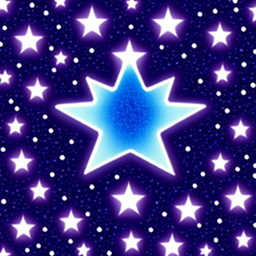

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


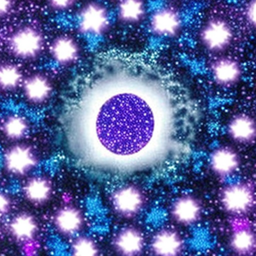

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


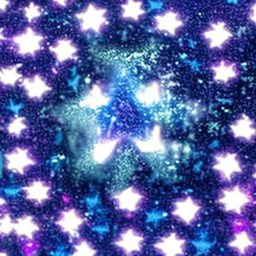

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


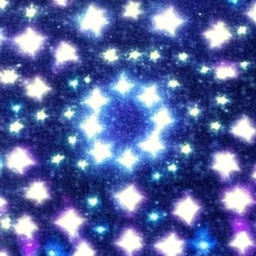

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


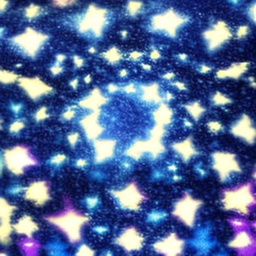

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


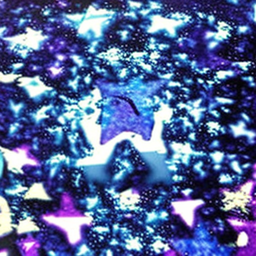

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


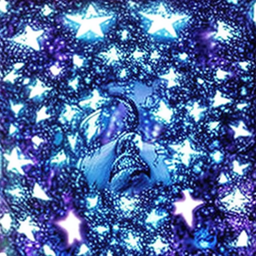

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


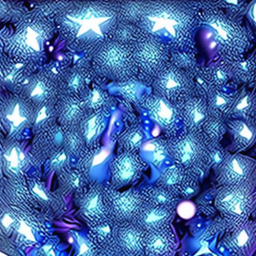

torch.Size([4, 3, 512, 512])


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


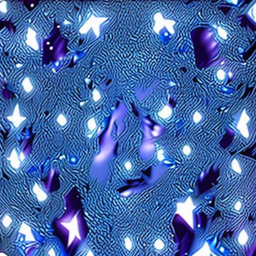

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


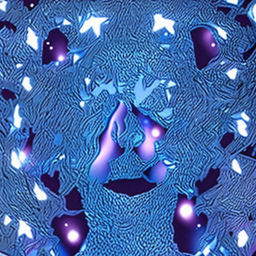

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


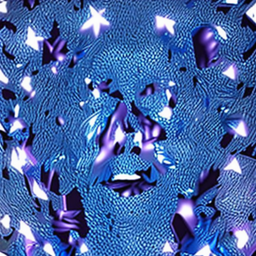

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


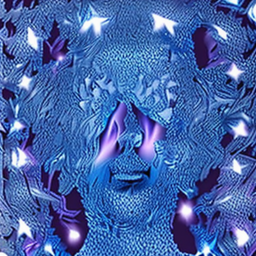

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


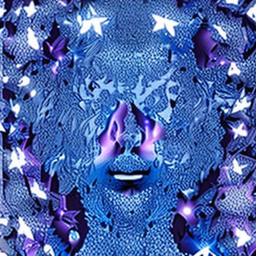

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


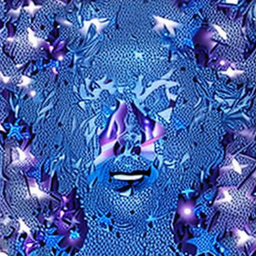

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


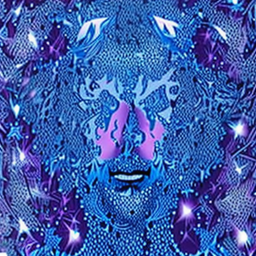

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


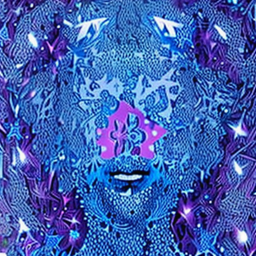

torch.Size([4, 3, 512, 512])


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


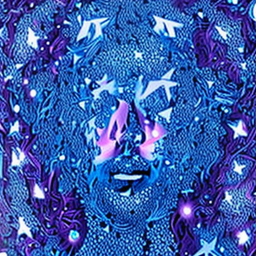

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


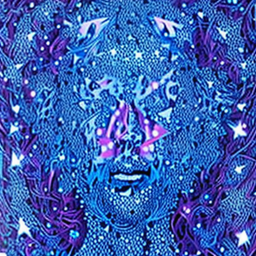

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


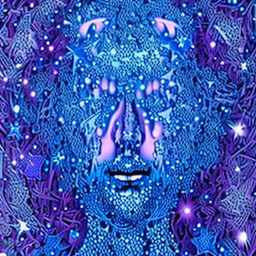

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


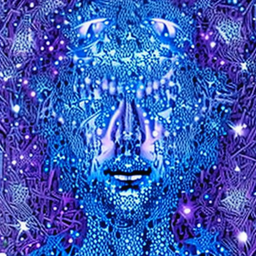

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


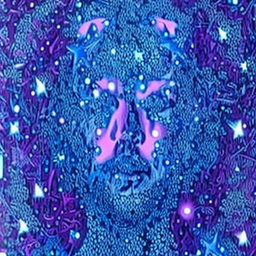

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


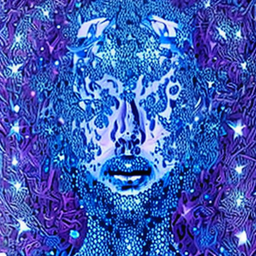

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


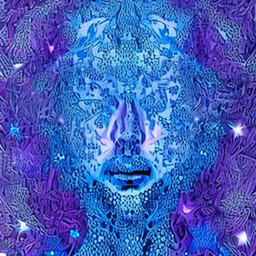

In [ ]:
progress_bar = tqdm(
    range(0, max_train_steps),
    initial=0,
    desc="Steps",
    # Only show the progress bar once on each machine.
    disable=not accelerator.is_local_main_process,
)
global_step = 0
losses = []

image_logs = None
for epoch in range(0, EPOCH):
    for step, batch in enumerate(train_dataloader):
        if step==0: print(batch["pixel_values"].shape)
        with accelerator.accumulate(student_controlnet):
            # Convert images to latent space
            latents = vae.encode(batch["pixel_values"].to(dtype=weight_dtype)).latent_dist.sample()
            latents = latents * vae.config.scaling_factor

            # Sample noise that we'll add to the latents
            noise = torch.randn_like(latents)
            bsz = latents.shape[0]
            # Sample a random timestep for each image
            timesteps = torch.randint(0, noise_scheduler.config.num_train_timesteps, (bsz,), device=latents.device)
            timesteps = timesteps.long()

            # Add noise to the latents according to the noise magnitude at each timestep
            # (this is the forward diffusion process)
            noisy_latents = noise_scheduler.add_noise(latents, noise, timesteps)

            # Get the text embedding for conditioning
            encoder_hidden_states = text_encoder(batch["input_ids"], return_dict=False)[0]

            controlnet_image = batch["conditioning_pixel_values"].to(dtype=weight_dtype)

            with torch.no_grad():
              down_block_res_samples_tea, mid_block_res_sample_tea = teacher_controlnet(
                  noisy_latents,
                  timesteps,
                  encoder_hidden_states=encoder_hidden_states,
                  controlnet_cond=controlnet_image,
                  return_dict=False,
              )

            down_block_res_samples, mid_block_res_sample = student_controlnet(
                noisy_latents,
                timesteps,
                encoder_hidden_states=encoder_hidden_states,
                controlnet_cond=controlnet_image,
                return_dict=False,
            )

            # Predict the noise residual
            model_pred = unet(
                noisy_latents,
                timesteps,
                encoder_hidden_states=encoder_hidden_states,
                down_block_additional_residuals=[
                    sample.to(dtype=weight_dtype) for sample in down_block_res_samples
                ],
                mid_block_additional_residual=mid_block_res_sample.to(dtype=weight_dtype),
                return_dict=False,
            )[0]

            with torch.no_grad():
              model_pred_teacher = unet(
                  noisy_latents,
                  timesteps,
                  encoder_hidden_states=encoder_hidden_states,
                  down_block_additional_residuals=[
                      sample.to(dtype=weight_dtype) for sample in down_block_res_samples_tea
                  ],
                  mid_block_additional_residual=mid_block_res_sample_tea.to(dtype=weight_dtype),
                  return_dict=False,
              )[0]

            # Get the target for loss depending on the prediction type
            target = noise
            diff_loss = F.mse_loss(model_pred.float(), target.float(), reduction="mean")
            noise_dist_loss = F.mse_loss(model_pred.float(), model_pred_teacher.float(), reduction="mean")

            stu_res = [*down_block_res_samples, mid_block_res_sample]
            tea_res = [*down_block_res_samples_tea, mid_block_res_sample_tea]
            kd_loss, mse_list = controlnet_mse(stu_res, tea_res, reduction="mean")

            loss = diff_loss + noise_dist_loss + 0.05*kd_loss
            with torch.no_grad():
              losses.append({"diff_loss":diff_loss.detach().cpu(), "kd_loss":kd_loss.detach().cpu(), "noise_dist_loss":noise_dist_loss.detach().cpu(), "mse_list":mse_list.detach().cpu()})

            accelerator.backward(loss)
            if accelerator.sync_gradients:
                params_to_clip = student_controlnet.parameters()
                accelerator.clip_grad_norm_(params_to_clip, 1.0)
            optimizer.step()
            lr_scheduler.step()
            optimizer.zero_grad(set_to_none=True)

        # Checks if the accelerator has performed an optimization step behind the scenes
        if accelerator.sync_gradients:
            progress_bar.update(1)
            progress_bar.set_description(f"diff_loss : {float(diff_loss.detach())}, kd_loss : {float(kd_loss.detach())}, noise_loss ; {float(noise_dist_loss.detach())}")
            global_step += 1

            if (global_step % VALIDATION_STEP == 0 or global_step==1) and VALIDATION_PATH != "" and VALIDATION_PROMPT != "":
              checkpoint_dir = f"/content/checkpoint-{global_step}"
              student_controlnet.save_pretrained(checkpoint_dir)
              image = generate_validation_image(vae, text_encoder, tokenizer, unet, checkpoint_dir, accelerator, torch.float16)
              display(image.resize((256, 256)))


In [ ]:
losses

[{'diff_loss': tensor(0.1678),
  'kd_loss': tensor(1.0020),
  'noise_dist_loss': tensor(0.0777),
  'mse_list': tensor([1.0072, 1.0000, 1.0004, 1.0139, 1.0023, 1.0000, 0.9997, 0.9998, 1.0010,
          1.0009, 1.0010, 0.9998, 1.0005])},
 {'diff_loss': tensor(0.1392),
  'kd_loss': tensor(1.0021),
  'noise_dist_loss': tensor(0.0529),
  'mse_list': tensor([1.0062, 1.0008, 1.0000, 1.0132, 1.0025, 0.9999, 1.0000, 1.0021, 1.0008,
          1.0006, 1.0011, 1.0001, 0.9997])},
 {'diff_loss': tensor(0.1706),
  'kd_loss': tensor(1.0023),
  'noise_dist_loss': tensor(0.0675),
  'mse_list': tensor([1.0083, 0.9998, 1.0003, 1.0143, 1.0035, 1.0002, 0.9997, 1.0024, 1.0001,
          0.9997, 1.0009, 1.0004, 1.0007])},
 {'diff_loss': tensor(0.2534),
  'kd_loss': tensor(1.0023),
  'noise_dist_loss': tensor(0.0861),
  'mse_list': tensor([1.0084, 1.0013, 0.9998, 1.0161, 1.0025, 0.9998, 1.0005, 1.0003, 1.0007,
          0.9999, 1.0007, 1.0003, 0.9999])},
 {'diff_loss': tensor(0.1528),
  'kd_loss': tensor(1.002

In [ ]:
checkpoint_dir = f"/content/checkpoint-4500"
student_controlnet.save_pretrained(checkpoint_dir)

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


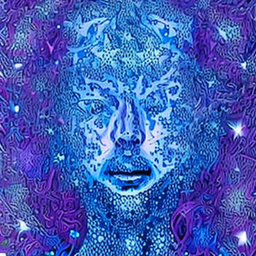

In [ ]:
image = generate_validation_image(vae, text_encoder, tokenizer, unet, checkpoint_dir, accelerator, torch.float16)
display(image.resize((256, 256)))

In [ ]:
import pickle

with open('losses.pkl', 'wb') as f:
  pickle.dump(losses, f)

In [ ]:
checkpoint_dir = f"/content/checkpoint-{global_step}"
student_controlnet.save_pretrained(checkpoint_dir)
image = generate_validation_image(vae, text_encoder, tokenizer, unet, checkpoint_dir, accelerator, torch.float16)
display(image.resize((256, 256)))

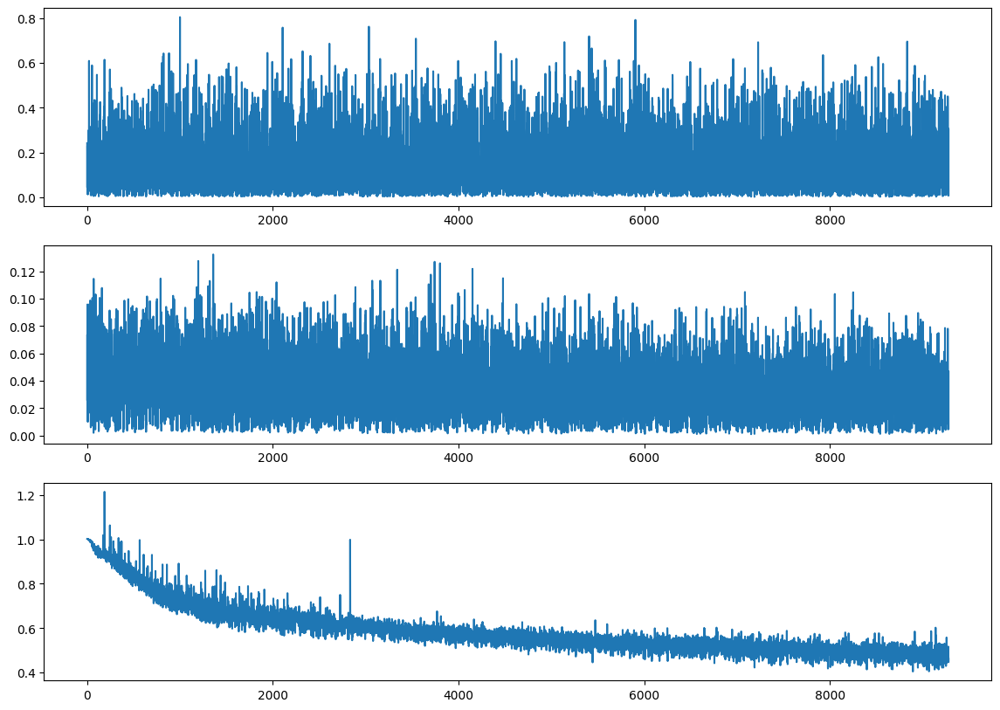

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 10))
plt.subplot(311)
plt.plot([l["diff_loss"] for l in losses])

plt.subplot(312)
plt.plot([l["noise_dist_loss"] for l in losses])

plt.subplot(313)
plt.plot([l["kd_loss"] for l in losses])
plt.show()

##Eval test


In [ ]:
EVAL_DIR = "/content/checkpoint-4500"

In [ ]:
controlnet = FlexibleModulatedControlNetModel.from_pretrained(EVAL_DIR, torch_dtype=torch.float16, use_safetensors=True).to("cuda")
#controlnet = FlexibleStructureControlNetModel.from_pretrained(EVAL_DIR, torch_dtype=torch.float16, use_safetensors=True).to("cuda")
#controlnet = SimilarStructureControlNetModel.from_pretrained(EVAL_DIR, torch_dtype=torch.float16, use_safetensors=True).to("cuda")
#controlnet = ControlNetModel.from_pretrained(CONTROLNET_PATH, torch_dtype=torch.float16).to("cuda")
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    MODEL_PATH, controlnet=controlnet, torch_dtype=torch.float16, use_safetensors=True
).to("cuda")

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe.enable_model_cpu_offload()

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [ ]:
validation_image = Image.open(VALIDATION_PATH).convert("RGB")

# jadiin validation image -> canny
validation_image = apply_canny(validation_image, low_threshold, high_threshold, detect_resolution=512, image_resolution=512)

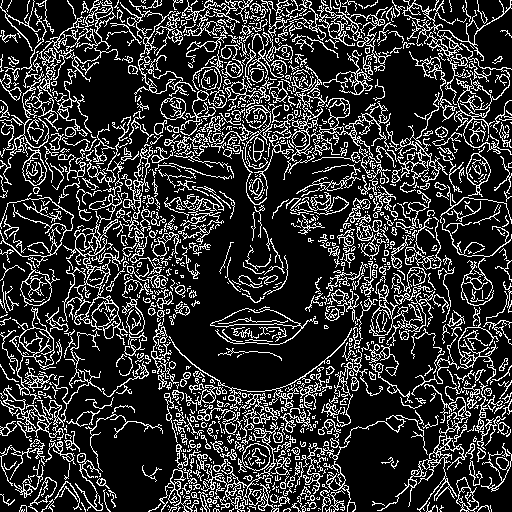

In [ ]:
validation_image

  0%|          | 0/50 [00:00<?, ?it/s]

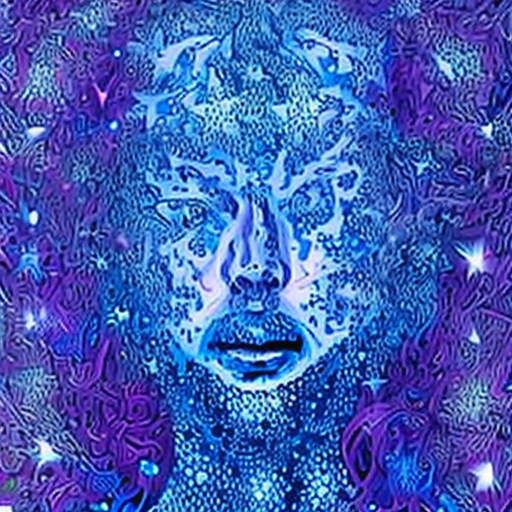

In [ ]:
generator = torch.Generator(device=accelerator.device).manual_seed(42)
torch.cuda.empty_cache()
output = pipe(
    VALIDATION_PROMPT, image=validation_image, generator=generator
).images[0] #ganti promptnya aja
output

  0%|          | 0/50 [00:00<?, ?it/s]

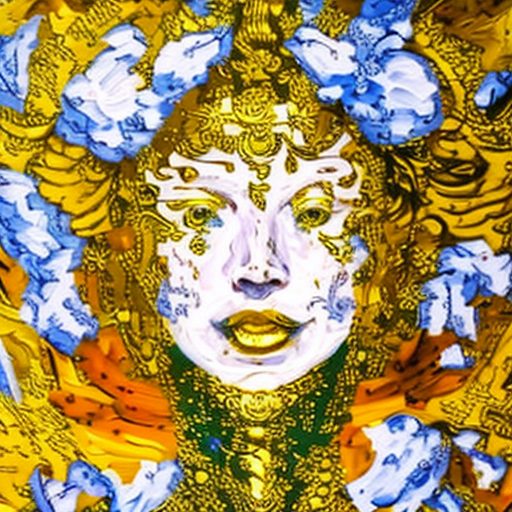

In [ ]:
generator = torch.Generator(device=accelerator.device).manual_seed(42)
torch.cuda.empty_cache()
output = pipe(
    "oil painting face of a goddess of hapiness, white with yellow flares, beautiful majestic", image=validation_image, generator=generator
).images[0] #ganti promptnya aja
output

  0%|          | 0/50 [00:00<?, ?it/s]

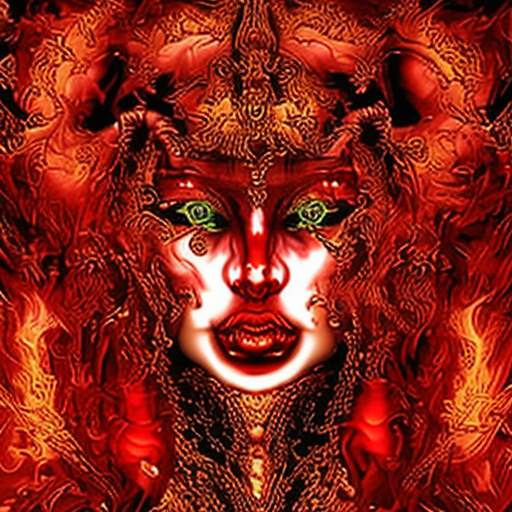

In [ ]:
generator = torch.Generator(device=accelerator.device).manual_seed(42)
torch.cuda.empty_cache()
output = pipe(
    "face of a red fire goddess, demonic", image=validation_image, generator=generator
).images[0] #ganti promptnya aja
output

#Metrics

In [ ]:
from torchvision import transforms

device='cuda'

class BaseMetric():
  def __init__(self):
    self.count = torch.Tensor([0.]).to(device)
    self.score = torch.Tensor([0.]).to(device)
    self.std = torch.Tensor([0.]).to(device)
    self.score_list = torch.Tensor([]).to(device)

  def compute(self):
    raise NotImplementedError

  def update(self, ground_truth_image, image):
    s = self.compute(ground_truth_image, image)
    self.score = self.score * (self.count/(self.count+1.)) + s * (1./(self.count+1.))
    self.count = self.count + 1
    self.score_list = torch.cat([self.score_list, s.ravel()], axis=0)
    self.std = ((self.score_list - self.score) ** 2).mean()
    return self

  def reset(self):
    self.count = torch.Tensor([0.]).to(device)
    self.score = torch.Tensor([0.]).to(device)
    self.std = torch.Tensor([0.]).to(device)
    self.score_list = torch.Tensor([]).to(device)
    return self

  def print(self):
    print(f"{self.__class__.__name__} : {self.score.cpu().numpy()[0]} ± {self.std}")

class FID_metric():
  def __init__(self):
    self.metric = FrechetInceptionDistance(feature=64, normalize=True).to(device)
    self.preprocess = transforms.Compose([
        transforms.Resize(512, interpolation=transforms.InterpolationMode.BILINEAR),
        transforms.ToTensor()
    ])

  def score(self):
    return self.metric.compute()

  def update(self, image, real=False):
    image = self.preprocess(image).unsqueeze(0).to(device)
    self.metric.update(image, real=real)

  def reset(self):
    self.metric.reset()

  def print(self):
    print(f"{self.__class__.__name__} : {self.score()}")

class SSIM_metric(BaseMetric):
  def __init__(self):
    super().__init__()
    self.metric = StructuralSimilarityIndexMeasure().to(device)
    self.preprocess = transforms.Compose([
        transforms.Resize(512, interpolation=transforms.InterpolationMode.BILINEAR),
        transforms.ToTensor()
    ])

  def compute(self, ground_truth_image, image):
    image = self.preprocess(image).unsqueeze(0).to(device)
    gt_im = self.preprocess(ground_truth_image).unsqueeze(0).to(device)
    score = torch.Tensor([self.metric(image, gt_im)])
    return score.to(device)

class PSNR_metric(BaseMetric):
  def __init__(self):
    super().__init__()
    self.metric = PeakSignalNoiseRatio().to(device)
    self.preprocess = transforms.Compose([
        transforms.Resize(512, interpolation=transforms.InterpolationMode.BILINEAR),
        transforms.ToTensor()
    ])

  def compute(self, ground_truth_image, image):
    image = self.preprocess(image).unsqueeze(0).to(device)
    gt_im = self.preprocess(ground_truth_image).unsqueeze(0).to(device)
    score = torch.Tensor([self.metric(image, gt_im)])
    return score.to(device)

class LPIPS_metric(BaseMetric):
  def __init__(self):
    super().__init__()
    self.metric = LearnedPerceptualImagePatchSimilarity(net_type='squeeze').to(device)
    self.preprocess = transforms.Compose([
        transforms.Resize(512, interpolation=transforms.InterpolationMode.BILINEAR),
        transforms.ToTensor()
    ])

  def compute(self, ground_truth_image, image):
    image = self.preprocess(image).unsqueeze(0).to(device)
    gt_im = self.preprocess(ground_truth_image).unsqueeze(0).to(device)
    score = torch.Tensor([self.metric(image, gt_im)])
    return score.to(device)

In [ ]:
#load_controlnet
EVAL_DIR = "/content/drive/MyDrive/Deep_Learning/ControlNet/Train14"

controlnet = FlexibleModulatedControlNetModel.from_pretrained(EVAL_DIR, torch_dtype=torch.float16, use_safetensors=True).to("cuda")
#controlnet = SimilarStructureControlNetModel.from_pretrained(EVAL_DIR, torch_dtype=torch.float16, use_safetensors=True).to("cuda")
#controlnet = ControlNetModel.from_pretrained(CONTROLNET_PATH, torch_dtype=torch.float16).to("cuda")
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    MODEL_PATH, controlnet=controlnet, torch_dtype=torch.float16, use_safetensors=True
).to("cuda")

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe.enable_model_cpu_offload()
pipe.set_progress_bar_config(disable=True)

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [ ]:
#buat load teacher controlnet
teacher_controlnet = ControlNetModel.from_pretrained(CONTROLNET_PATH, torch_dtype=torch.float16).to("cuda")
pipe_teacher = StableDiffusionControlNetPipeline.from_pretrained(
    MODEL_PATH, controlnet=teacher_controlnet, torch_dtype=torch.float16, use_safetensors=True
).to("cuda")

pipe_teacher.scheduler = UniPCMultistepScheduler.from_config(pipe_teacher.scheduler.config)
pipe_teacher.enable_model_cpu_offload()
pipe_teacher.set_progress_bar_config(disable=True)

An error occurred while trying to fetch thibaud/controlnet-sd21-canny-diffusers: thibaud/controlnet-sd21-canny-diffusers does not appear to have a file named diffusion_pytorch_model.safetensors.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [ ]:
EVAL_DS_PATH = "ErioLatte/laion_100"
eval_ds = load_dataset(EVAL_DS_PATH)

README.md:   0%|          | 0.00/383 [00:00<?, ?B/s]

train-00000-of-00001.parquet:   0%|          | 0.00/45.5M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/100 [00:00<?, ? examples/s]

In [ ]:
#Metrics main code
fid_metric = FID_metric()
ssim_metric = SSIM_metric()
psnr_metric = PSNR_metric()
lpips_metric = LPIPS_metric()

fid_metric_wrt_teacher = FID_metric()
ssim_metric_wrt_teacher = SSIM_metric()
psnr_metric_wrt_teacher = PSNR_metric()
lpips_metric_wrt_teacher = LPIPS_metric()

prompts = []

for row in tqdm(eval_ds['train']):
  gt, can, prompt = row['image'].convert('RGB'), row['canny_image'], row['prompt']
  generator = torch.Generator(device=device).manual_seed(42)
  torch.cuda.empty_cache()

  output = pipe(
      prompt, image=can, generator=generator, num_inference_steps=20
  ).images[0]

  output_teacher = pipe_teacher(
      prompt, image=can, generator=generator, num_inference_steps=20
  ).images[0]

  #w.r.t ground truth
  fid_metric.update(gt, real=True)
  fid_metric.update(output)
  ssim_metric.update(gt, output)
  psnr_metric.update(gt, output)
  lpips_metric.update(gt, output)

  #w.r.t teacher model
  fid_metric_wrt_teacher.update(output_teacher, real=True)
  fid_metric_wrt_teacher.update(output)
  ssim_metric_wrt_teacher.update(output_teacher, output)
  psnr_metric_wrt_teacher.update(output_teacher, output)
  lpips_metric_wrt_teacher.update(output_teacher, output)

print("Metrics With Respect to Ground Truth : ")
fid_metric.print()
ssim_metric.print()
psnr_metric.print()
lpips_metric.print()
print("")
print("Metrics With Respect to Teacher : ")
fid_metric_wrt_teacher.print()
ssim_metric_wrt_teacher.print()
psnr_metric_wrt_teacher.print()
lpips_metric_wrt_teacher.print()

Downloading: "https://github.com/toshas/torch-fidelity/releases/download/v0.2.0/weights-inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/weights-inception-2015-12-05-6726825d.pth

  0%|          | 0.00/91.2M [00:00<?, ?B/s]
  0%|          | 432k/91.2M [00:00<00:21, 4.36MB/s]
  1%|          | 992k/91.2M [00:00<00:18, 5.14MB/s]
  2%|▏         | 1.64M/91.2M [00:00<00:15, 5.97MB/s]
  3%|▎         | 2.43M/91.2M [00:00<00:13, 6.81MB/s]
  4%|▎         | 3.30M/91.2M [00:00<00:12, 7.58MB/s]
  5%|▍         | 4.30M/91.2M [00:00<00:10, 8.58MB/s]
  6%|▌         | 5.38M/91.2M [00:00<00:09, 9.42MB/s]
  7%|▋         | 6.28M/91.2M [00:01<00:27, 3.24MB/s]
  8%|▊         | 6.94M/91.2M [00:01<00:25, 3.51MB/s]
  9%|▉         | 8.23M/91.2M [00:01<00:17, 5.04MB/s]
 11%|█         | 9.70M/91.2M [00:01<00:12, 6.89MB/s]
 12%|█▏        | 10.8M/91.2M [00:01<00:10, 7.85MB/s]
 14%|█▎        | 12.5M/91.2M [00:01<00:08, 10.1MB/s]
 16%|█▌        | 14.2M/91.2M [00:02<00:06, 12.0MB/s]
 18%|█▊     

  0%|          | 0/100 [00:00<?, ?it/s]

Metrics With Respect to Ground Truth : 
FID_metric : 12.919746398925781
SSIM_metric : 0.18497109413146973 ± 0.010595399886369705
PSNR_metric : 8.21103286743164 ± 1.4417400360107422
LPIPS_metric : 0.49156513810157776 ± 0.0056077949702739716

Metrics With Respect to Teacher : 
FID_metric : 3.805234670639038
SSIM_metric : 0.14392706751823425 ± 0.005466629285365343
PSNR_metric : 8.224248886108398 ± 1.5440202951431274
LPIPS_metric : 0.46708154678344727 ± 0.005489544942975044
